In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

#to display all rows columns 
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)

In [2]:
df = pd.read_csv('IPL_ball_by_ball_updated.csv')

In [3]:
df.head(1)

,match_id,season,start_date,venue,innings,ball,batting_team,bowling_team,striker,non_striker,bowler,runs_off_bat,extras,wides,noballs,byes,legbyes,penalty,wicket_type,player_dismissed,other_wicket_type,other_player_dismissed
0,335982,2008,2008-04-18,M Chinnaswamy Stadium,2,6.8,Royal Challengers Bangalore,Kolkata Knight Riders,MV Boucher,CL White,AB Agarkar,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.innings.unique()

array([2, 1, 4, 3, 6, 5], dtype=int64)

In [5]:
df = df[(df.innings == 1) | (df.innings == 2)]

In [6]:
df.innings.unique()

array([2, 1], dtype=int64)

In [7]:
df.bowling_team.unique()

array(['Kolkata Knight Riders', 'Royal Challengers Bangalore',
       'Delhi Daredevils', 'Chennai Super Kings', 'Rajasthan Royals',
       'Kings XI Punjab', 'Mumbai Indians', 'Deccan Chargers',
       'Kochi Tuskers Kerala', 'Pune Warriors', 'Sunrisers Hyderabad',
       'Rising Pune Supergiants', 'Gujarat Lions',
       'Rising Pune Supergiant', 'Delhi Capitals', 'Punjab Kings'],
      dtype=object)

In [8]:
df[df.batting_team == 'Chennai Super Kings']['striker'].unique()

array(['MEK Hussey', 'JDP Oram', 'SK Raina', 'S Badrinath', 'ML Hayden',
       'PA Patel', 'MS Dhoni', 'JA Morkel', 'S Vidyut', 'SP Fleming',
       'MS Gony', 'Joginder Sharma', 'M Muralitharan', 'M Ntini',
       'S Anirudha', 'CK Kapugedera', 'L Balaji', 'A Mukund',
       'T Thushara', 'A Flintoff', 'SB Jakati', 'M Vijay', 'GJ Bailey',
       'R Ashwin', 'S Tyagi', 'JM Kemp', 'KB Arun Karthik',
       'DE Bollinger', 'SB Styris', 'S Randiv', 'WP Saha', 'DJ Bravo',
       'F du Plessis', 'RA Jadeja', 'KMDN Kulasekara', 'B Laughlin',
       'AS Rajpoot', 'CH Morris', 'MM Sharma', 'DR Smith', 'BB McCullum',
       'M Manhas', 'DJ Hussey', 'A Nehra', 'P Negi', 'RG More',
       'KM Jadhav', 'AT Rayudu', 'SR Watson', 'MA Wood', 'Imran Tahir',
       'Harbhajan Singh', 'DL Chahar', 'SW Billings', 'DR Shorey',
       'SN Thakur', 'MJ Santner', 'SM Curran', 'RD Gaikwad',
       'N Jagadeesan', 'MM Ali', 'RV Uthappa'], dtype=object)

In [9]:
msd_df=df[(df['striker']=='MS Dhoni')]

In [10]:
msd_df.head(2)

,match_id,season,start_date,venue,innings,ball,batting_team,bowling_team,striker,non_striker,bowler,runs_off_bat,extras,wides,noballs,byes,legbyes,penalty,wicket_type,player_dismissed,other_wicket_type,other_player_dismissed
559,335983,2008,2008-04-19,"Punjab Cricket Association Stadium, Mohali",1,7.1,Chennai Super Kings,Kings XI Punjab,MS Dhoni,MEK Hussey,JR Hopes,0,0,NaN,NaN,NaN,NaN,NaN,lbw,MS Dhoni,NaN,NaN
560,335983,2008,2008-04-19,"Punjab Cricket Association Stadium, Mohali",1,6.6,Chennai Super Kings,Kings XI Punjab,MS Dhoni,MEK Hussey,IK Pathan,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
#  No of runs scored?
#  No of balls faceed ?
#  No of times dimissed ?
#  strike rate 

In [12]:
# Runs
sum(msd_df.runs_off_bat)

4746L

In [13]:
# balls faced
len(msd_df)

3604

In [14]:
# outs
len(msd_df[msd_df.player_dismissed == 'MS Dhoni'])

117

In [15]:
# strike rate 
100*sum(msd_df.runs_off_bat)/len(msd_df)

131L

In [16]:
mdf = pd.DataFrame(msd_df.groupby('striker')['runs_off_bat'].sum()).reset_index()

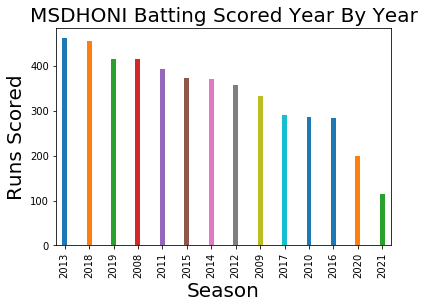

In [17]:
msd_df.groupby(['season'])['runs_off_bat'].sum().sort_values(ascending = False).plot(kind = 'bar' , width = 0.2)
plt.title('MSDHONI Batting Scored Year By Year', fontsize = 20)
plt.xlabel('Season', fontsize = 20)
plt.ylabel('Runs Scored', fontsize = 20) 
plt.show()

In [18]:
# Year by year MSDhoni scoring is  declining but he is a good captian and can held any pressure situation .

In [19]:
# Strike Rate in death overs

In [20]:
ms_death_over=msd_df[(msd_df['ball']>16)&(msd_df['wides'].isnull()==True)]

In [21]:
100*ms_death_over['runs_off_bat'].sum()/ms_death_over['ball'].count()

187

In [22]:
# Dismissed in death overs

In [23]:
dismiss_death_ovr=ms_death_over[(ms_death_over['player_dismissed']=='MS Dhoni')]

In [24]:
dismiss_death_ovr['ball'].count()

66

In [25]:
dismiss_death_ovr.groupby('wicket_type')['ball'].count()

wicket_type
bowled     8 
caught     52
run out    3 
stumped    3 
Name: ball, dtype: int64

In [26]:
len(ms_death_over['match_id'].unique())

139

In [33]:
df.striker.unique()

array(['MV Boucher', 'W Jaffer', 'JH Kallis', 'CL White', 'V Kohli',
       'BB McCullum', 'Mohammad Hafeez', 'R Dravid', 'P Kumar', 'Z Khan',
       'SB Joshi', 'AA Noffke', 'B Akhil', 'SC Ganguly', 'RT Ponting',
       'DJ Hussey', 'M Kaif', 'M Rawat', 'RA Jadeja', 'DS Lehmann',
       'SK Warne', 'D Salunkhe', 'SM Katich', 'YK Pathan', 'T Kohli',
       'IK Pathan', 'SR Watson', 'S Dhawan', 'G Gambhir', 'V Sehwag',
       'SK Trivedi', 'KC Sangakkara', 'MEK Hussey', 'JDP Oram',
       'SK Raina', 'S Badrinath', 'ML Hayden', 'PA Patel', 'MS Dhoni',
       'Yuvraj Singh', 'JR Hopes', 'K Goel', 'AS Yadav', 'A Symonds',
       'SB Styris', 'SB Bangar', 'RP Singh', 'WPUJC Vaas', 'AC Gilchrist',
       'VVS Laxman', 'Y Venugopal Rao', 'WP Saha', 'RG Sharma',
       'LR Shukla', 'RV Uthappa', 'AM Nayar', 'PR Shah', 'SM Pollock',
       'Harbhajan Singh', 'ST Jayasuriya', 'DJ Thornely', 'L Ronchi',
       'LRPL Taylor', 'S Chanderpaul', 'Kamran Akmal', 'PP Chawla',
       'DPMD Jayawardene'

In [34]:
dfwk= df[(df.striker == 'MS Dhoni') |(df.striker == 'SV Samson')|(df.striker == 'RR Pant')|(df.striker == 'N Pooran')|(df.striker == 'MS Wade')|(df.striker == 'JM Bairstow')|(df.striker == 'JM Sharma')|(df.striker == 'KD Karthik')|(df.striker == 'SW Billings')]

In [35]:
dfwk.head(1)

,match_id,season,start_date,venue,innings,ball,batting_team,bowling_team,striker,non_striker,bowler,runs_off_bat,extras,wides,noballs,byes,legbyes,penalty,wicket_type,player_dismissed,other_wicket_type,other_player_dismissed
559,335983,2008,2008-04-19,"Punjab Cricket Association Stadium, Mohali",1,7.1,Chennai Super Kings,Kings XI Punjab,MS Dhoni,MEK Hussey,JR Hopes,0,0,NaN,NaN,NaN,NaN,NaN,lbw,MS Dhoni,NaN,NaN


In [36]:
dfwk.reset_index(inplace = True, drop =True)

In [39]:
dfwk.sort_values('runs_off_bat', ascending = False)

,match_id,season,start_date,venue,innings,ball,batting_team,bowling_team,striker,non_striker,bowler,runs_off_bat,extras,wides,noballs,byes,legbyes,penalty,wicket_type,player_dismissed,other_wicket_type,other_player_dismissed
9112,1178408,2019,2019-04-17,Rajiv Gandhi International Stadium,2,16.5,Sunrisers Hyderabad,Chennai Super Kings,JM Bairstow,YK Pathan,KV Sharma,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4386,829769,2015,2015-05-01,Wankhede Stadium,2,16.5,Rajasthan Royals,Mumbai Indians,SV Samson,KK Nair,SL Malinga,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7781,1136602,2018,2018-05-10,Arun Jaitley Stadium,1,19.4,Delhi Daredevils,Sunrisers Hyderabad,RR Pant,V Shankar,B Kumar,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1679,501251,2011,2011-05-10,"Punjab Cricket Association Stadium, Mohali",1,16.6,Kings XI Punjab,Mumbai Indians,KD Karthik,Mandeep Singh,DS Kulkarni,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9577,1178428,2019,2019-05-04,Arun Jaitley Stadium,2,6.3,Delhi Capitals,Rajasthan Royals,RR Pant,SS Iyer,R Parag,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9576,1178428,2019,2019-05-04,Arun Jaitley Stadium,2,6.4,Delhi Capitals,Rajasthan Royals,RR Pant,SS Iyer,R Parag,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1658,501249,2011,2011-05-09,Sawai Mansingh Stadium,1,18.6,Chennai Super Kings,Rajasthan Royals,MS Dhoni,JA Morkel,A Singh,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1657,501249,2011,2011-05-09,Sawai Mansingh Stadium,1,17.6,Chennai Super Kings,Rajasthan Royals,MS Dhoni,SK Raina,SR Watson,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10301,1216542,2020,2020-10-08,Dubai International Cricket Stadium,2,8.5,Kings XI Punjab,Sunrisers Hyderabad,N Pooran,GJ Maxwell,Abdul Samad,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1649,501249,2011,2011-05-09,Sawai Mansingh Stadium,1,16.1,Chennai Super Kings,Rajasthan Royals,MS Dhoni,SK Raina,SK Trivedi,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


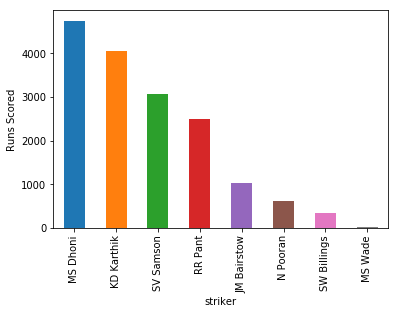

In [40]:

dfwk.groupby(['striker'])['runs_off_bat'].sum().sort_values(ascending=False).plot(kind= 'bar')
plt.ylabel('Runs Scored')
plt.show()

In [ ]:
# MSDhoni is still good wicket batsmans compare to others. He is still good caption  and can held pressure situation 
in a cool way. He is also know as Mr Cool . He is my favorite player. Season by season is perform is going but still good batsman . 
